In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
import matplotlib
import matplotlib.pyplot as plt
import sigpy as sp
import pandas as pd
import sigpy.plot as pl
import numpy as np
import os
import sys
from pathlib import Path
import jax as jx
import time

#ksp = np.load(r"/Users/ayman/Library/CloudStorage/OneDrive-King'sCollegeLondon/Project/Sigpytutorial/projection_ksp.npy")
#coord = np.load(r"/Users/ayman/Library/CloudStorage/OneDrive-King'sCollegeLondon/Project/Sigpytutorial/projection_coord.npy")

sys.path.insert(0,'/Users/ayman/Desktop/MSc Project Local/MSc-Project-ZTE')
import aymansigmri as asm


sys.path.insert(0, "/Users/ayman/Documents/GitHub/riesling/python")

import riesling as rlp



riesling_bin = Path.home() / "Documents" / "github" / "riesling" / "build" / "cxx" / "riesling"
os.environ["PATH"] += os.pathsep + str(riesling_bin)

In [52]:
hires = '/Users/ayman/Desktop/MSc Project Local/MSc-Project-ZTE/riselingwork/hires'
coorhires = rlp.io.read_trajectory(f'{hires}.h5')
coorhires = np.asarray(coorhires)
kspacehires = rlp.io.read_data(f'{hires}.h5')
kspacehires = np.asarray(kspacehires)
kspacehires = kspacehires[0, 0] 
kspacehires = np.moveaxis(kspacehires, -1, 0)


print(coorhires.shape)

(16128, 122, 3)


In [2]:
import h5py
def h5tonum(file, showshape=False):
    with h5py.File(file) as f:     
        d = f['data'][:]             
        traj = f['trajectory'][:]
        d = d[0,:,0]
        traj = np.moveaxis(traj,-1,0)
        if showshape == True:
            print(d.shape)
            print(traj.shape)
    return d, traj

riesling_im, traj = h5tonum('/Users/ayman/Desktop/MSc Project Local/MSc-Project-ZTE/riselingwork/hires-nufft.h5', showshape=True)
riesling_cartksp = sp.fft(riesling_im)


(44, 126, 126, 126)
(3, 16128, 122)


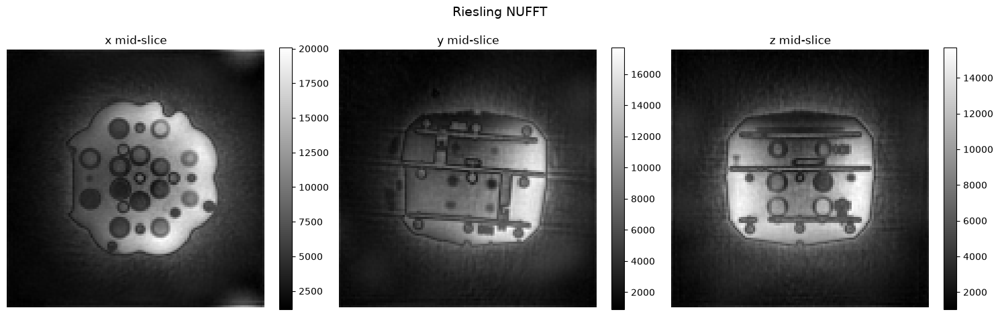

In [3]:
def plot_planes(kspace, title, savefig=None):
    im_grid = sp.ifft(kspace)
    rss = np.sum(np.abs(im_grid)**2, axis=0)**0.5

    nx, ny, nz = rss.shape
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    fig.suptitle(title, fontsize=14)

    for ax, (sl, sl_title) in zip(axes, [
        (rss[nx // 2, :, :], 'x mid-slice'),
        (rss[:, ny // 2, :], 'y mid-slice'),
        (rss[:, :, nz // 2], 'z mid-slice'),
    ]):
        img = ax.imshow(np.abs(sl), cmap='gray')
        ax.set_title(sl_title)
        ax.axis('off')
        fig.colorbar(img, ax=ax, fraction=0.046)

    plt.tight_layout()
    if savefig is not None:
        fig.savefig(savefig, dpi=300, bbox_inches='tight')
    plt.show()

plot_planes(riesling_cartksp, title='Riesling NUFFT')

## Goal of the notebook

### Figure out best params for 3d data

- get the above file format into something that riseling can read

In [4]:
def data_prep(kspace, coords, n_missing, resize_x, resize_y, inner_sidelen):
    zte_radial_kspacedlt, zte_radial_coordsdlt, zte_radial_kspacezero, zte_radial_coordszero, mask = asm.generate_zte_data(ksp=kspace, coord=coords, n_missing=n_missing, undersampling_factor=1)
    cartesian_zte = asm.nufft_gridding(kspace=zte_radial_kspacezero, coords=zte_radial_coordszero)
    cartesian_kspace_enl = asm.zero_padding(cart_kspace=kspace, resize_x=resize_x, resize_y=resize_y)
    inner_region, inner_mask, start, end = asm.inner_portion(enlarged_kspace=cartesian_kspace_enl, inner_sidelen=inner_sidelen)
    return(inner_region, inner_mask, start, end)

def rebuild(output_kspace, inner_mask, inner_start, inner_end, enlarged_kspace, resize_x, resize_y):
    recombined = asm.jigsaw(output_kspace=output_kspace, isolation_mask = inner_mask, start=inner_start, end=inner_end, enlarged_kspace=enlarged_kspace)
    filled_ksp = asm.zero_padding(recombined, resize_x, resize_y)
    return(filled_ksp)

def plot_mask(isolated_kspace, mask, innersidelen, sidelencart):



    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 8))

    im = ax[0].imshow(np.abs(isolated_kspace[0]), cmap='viridis', origin='lower')
    fig.colorbar(im, ax=ax[0], label='kspace value')
    ax[0].set_title('Cartesian')
    ax[0].set_xlabel('ky')
    ax[0].set_ylabel('kz')
    ax[0].set_xlim(innersidelen/2 - sidelencart, innersidelen/2 + sidelencart)
    ax[0].set_ylim(innersidelen/2 - sidelencart, innersidelen/2 + sidelencart)
    ax[0].xaxis.set_minor_locator(plt.MultipleLocator(1, offset=0.5))
    ax[0].yaxis.set_minor_locator(plt.MultipleLocator(1, offset=0.5))
    ax[0].grid(visible=True, which='minor', linewidth=1)
    ax[0].xaxis.set_major_locator(plt.MultipleLocator(1))
    ax[0].yaxis.set_major_locator(plt.MultipleLocator(1))

    yy, xx = np.mgrid[0:mask.shape[0], 0:mask.shape[0]]
    im1 = ax[1].scatter(xx.ravel(), yy.ravel(), c=mask.ravel().astype(int), cmap='viridis', s=300, marker='s', zorder=3)
    fig.colorbar(im1, ax=ax[1], label='mask')
    ax[1].set_title('Centre mask')
    ax[1].set_xlabel('y')
    ax[1].set_ylabel('z')
    ax[1].set_aspect('equal', adjustable='box')
    ax[1].set_xlim(innersidelen/2 - sidelencart, innersidelen/2 + sidelencart)
    ax[1].set_ylim(innersidelen/2 - sidelencart, innersidelen/2 + sidelencart)
    ax[1].xaxis.set_minor_locator(plt.MultipleLocator(1, offset=0.5))
    ax[1].yaxis.set_minor_locator(plt.MultipleLocator(1, offset=0.5))
    ax[1].grid(visible=True, which='minor', linewidth=1)
    ax[1].xaxis.set_major_locator(plt.MultipleLocator(1))
    ax[1].yaxis.set_major_locator(plt.MultipleLocator(1))

    plt.show()

In [5]:
width=4
gap = 3
num_iters = 50


inner_wid=50
indiv2 = int(inner_wid/2)

nc, nx, ny, nz = riesling_cartksp.shape

cartesian_zte = riesling_cartksp[:,nx // 2, :, :]

im_grid0 = sp.ifft(cartesian_zte, axes=(-2, -1))
preloop = np.sum(np.abs(im_grid0)**2, axis=0)**0.5

In [6]:
cartesian_kspace_enl = asm.zero_padding(cart_kspace=cartesian_zte, resize_x=504, resize_y=504)

inner_region, inner_mask, start, end = asm.inner_portion(enlarged_kspace=cartesian_kspace_enl, inner_sidelen=inner_wid)

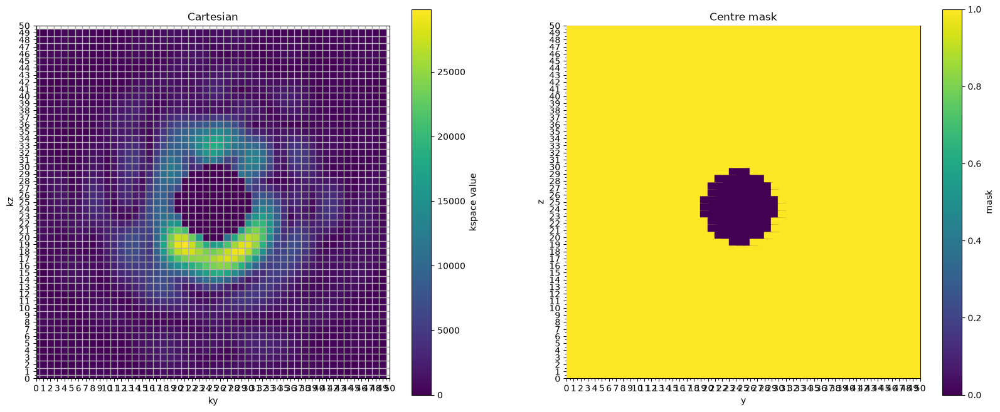

In [7]:
cy, cx = inner_wid // 2, inner_wid // 2
r = 5
yy, xx = np.ogrid[:inner_wid, :inner_wid]
maskb = (yy - cy)**2 + (xx - cx)**2 > r**2 +2

maskb[(cx-5):(cx+6), cy] = False
maskb[(cx), (cy-5):(cy+6)] = False

inner_removedb = inner_region.copy()
inner_removedb[:,~maskb] = 0



plot_mask(inner_removedb, mask=maskb, innersidelen=inner_wid,sidelencart=25)


In [ ]:
def softimpute_ALS_ortho(X_H, M_H, rank, lamda, n_iters, seed):
        I = np.eye(rank)
        m,n = np.shape(X_H)
        rng = np.random.default_rng(seed)
        U = rng.standard_normal((m, rank)) + 1j * rng.standard_normal((m, rank))
        V = np.zeros((n, rank),dtype=np.complex64)
        U, _ = np.linalg.qr(U)
        D = I.copy()

        A = np.dot(U,D)
        B = np.dot(V,D)
        iter_count = 0
        ABt = A @ B.conj().T

        norms = {'A': [], 'B': [], 'ABt': [], 'X_star': [], 'rel_change': [], 'residual': []}
        while iter_count < n_iters:
            ABt_prev = ABt
            X_star = np.where(M_H, X_H, ABt)
            B = X_star.conj().T @ A @ np.linalg.inv(A.conj().T @ A + lamda*I)
            ABt = A @ B.conj().T
    
            X_star = np.where(M_H, X_H, ABt)
            A = X_star @ B @ np.linalg.inv(B.conj().T @ B + lamda*I)
            ABt = A @ B.conj().T

            norms['A'].append(np.linalg.norm(A))
            norms['B'].append(np.linalg.norm(B))
            norms['ABt'].append(np.linalg.norm(ABt))
            norms['X_star'].append(np.linalg.norm(X_star))
            norms['rel_change'].append(np.linalg.norm(ABt - ABt_prev) / np.linalg.norm(ABt))
            norms['residual'].append(np.linalg.norm(ABt - X_star))

            iter_count += 1
        return(ABt, norms)


def softimpute_ALS(X_H, M_H, rank, lamda, n_iters, seed):
        I = np.eye(rank)
        m,n = np.shape(X_H)
        rng = np.random.default_rng(seed)
        U = rng.standard_normal((m, rank)) + 1j * rng.standard_normal((m, rank))
        V = rng.standard_normal((n, rank)) + 1j * rng.standard_normal((n, rank))

        D = I.copy()


        A = np.dot(U,D)
        B = np.dot(V,D)
        iter_count = 0
        ABt = A @ B.conj().T
        norms = {'A': [], 'B': [], 'ABt': [], 'X_star': [], 'rel_change': [], 'residual': []}
        while iter_count < n_iters:
            ABt_prev = ABt
            X_star = np.where(M_H, X_H, ABt)
            A = X_star @ B @ np.linalg.inv(B.conj().T @ B + lamda*I)
            ABt = A @ B.conj().T
            X_star = np.where(M_H, X_H, ABt)
            B = X_star.conj().T @ A @ np.linalg.inv(A.conj().T @ A + lamda*I)

            norms['A'].append(np.linalg.norm(A))
            norms['B'].append(np.linalg.norm(B))
            norms['ABt'].append(np.linalg.norm(ABt))
            norms['X_star'].append(np.linalg.norm(X_star))
            norms['rel_change'].append(np.linalg.norm(ABt - ABt_prev) / np.linalg.norm(ABt))
            norms['residual'].append(np.linalg.norm(ABt - X_star))

            ABt = A @ B.conj().T
            iter_count += 1
        return(ABt, norms)


def LORAKS_imputeals_ortho(n_iters, window_size, cartesian_inputkspace, dtg_mask, rank, lamda, stride, im_dim, enlarged_kspace, seed, inner_mask, inner_start, inner_end):
    ksp_forhankel = cartesian_inputkspace.copy()
    ksp_zerod = ksp_forhankel * dtg_mask
    hankel_matrix, *_ = asm.hankel_2(kspace=ksp_zerod, w=window_size, s=stride)
    mask_coiled = np.broadcast_to(dtg_mask, (cartesian_inputkspace.shape))
    masked_hankel, *_ = asm.hankel(mask_coiled, window_size)
    masked_hankel = np.real(masked_hankel) > 0.5
    
    
    filled_hankel, norms = softimpute_ALS_ortho(X_H = hankel_matrix, M_H = masked_hankel, rank = rank, lamda = lamda, n_iters=n_iters, seed=seed)

    kspace_cart_coils_recon = asm.hankel_H_averaged_2(filled_hankel, n_coils=ksp_forhankel.shape[0], Nx=ksp_forhankel.shape[1], Ny=ksp_forhankel.shape[2], w=window_size, s=stride)
    kspace_cart_coils_recon = np.where(dtg_mask, cartesian_inputkspace, kspace_cart_coils_recon)
    output_kspace = kspace_cart_coils_recon.copy()
    filled_ksp = rebuild(output_kspace=output_kspace, inner_mask = inner_mask, inner_start = inner_start, inner_end = inner_end, enlarged_kspace=enlarged_kspace, resize_x = im_dim, resize_y = im_dim)
    im_grid0 = sp.ifft(filled_ksp, axes=(-2, -1))
    im_0 = np.sum(np.abs(im_grid0)**2, axis=0)**0.5

    return (filled_ksp, im_0, norms)



def LORAKS_imputeals(n_iters, window_size, cartesian_inputkspace, dtg_mask, rank, lamda, stride, im_dim, enlarged_kspace, seed, inner_mask, inner_start, inner_end):
    ksp_forhankel = cartesian_inputkspace.copy()
    ksp_zerod = ksp_forhankel * dtg_mask
    hankel_matrix, *_ = asm.hankel_2(kspace=ksp_zerod, w=window_size, s=stride)
    mask_coiled = np.broadcast_to(dtg_mask, (cartesian_inputkspace.shape))
    masked_hankel, *_ = asm.hankel(mask_coiled, window_size)
    masked_hankel = np.real(masked_hankel) > 0.5
    
    
    filled_hankel, norms = softimpute_ALS(X_H = hankel_matrix, M_H = masked_hankel, rank = rank, lamda = lamda, n_iters=n_iters, seed=seed)

    kspace_cart_coils_recon = asm.hankel_H_averaged_2(filled_hankel, n_coils=ksp_forhankel.shape[0], Nx=ksp_forhankel.shape[1], Ny=ksp_forhankel.shape[2], w=window_size, s=stride)
    kspace_cart_coils_recon = np.where(dtg_mask, cartesian_inputkspace, kspace_cart_coils_recon)
    output_kspace = kspace_cart_coils_recon.copy()
    filled_ksp = rebuild(output_kspace=output_kspace, inner_mask = inner_mask, inner_start = inner_start, inner_end = inner_end, enlarged_kspace=enlarged_kspace, resize_x = im_dim, resize_y = im_dim)
    im_grid0 = sp.ifft(filled_ksp, axes=(-2, -1))
    im_0 = np.sum(np.abs(im_grid0)**2, axis=0)**0.5

    return (filled_ksp, im_0, norms)

def LORAKS_loop(n_iters, window_size, zero_thresh, cartesian_inputkspace, dtg_mask, stride, im_dim, enlarged_kspace):
    ksp_forhankel = cartesian_inputkspace.copy()
    iter_count = 0
    deltas = []
    k_prev = None
    while iter_count < n_iters:
        hankel_matrix, n_coils, Numx, Numy = asm.hankel_2(kspace=ksp_forhankel, w=window_size,s=stride)
        U, S_reduced, Vh = asm.sig_val_thresholding_jax(data=hankel_matrix, zero_thresh=zero_thresh)
        data_recon = (U * S_reduced) @ Vh

        kspace_cart_coils_recon = asm.hankel_H_averaged_2(data_recon, n_coils=ksp_forhankel.shape[0], Nx=ksp_forhankel.shape[1], Ny=ksp_forhankel.shape[2], w=window_size, s=stride)
        kspace_cart_coils_consistent = kspace_cart_coils_recon.copy()

        for coil in range(ksp_forhankel.shape[0]):
            kspace_cart_coils_consistent[coil, dtg_mask] = cartesian_inputkspace[coil, dtg_mask]
        ksp_forhankel = kspace_cart_coils_consistent.copy()

        vec = ksp_forhankel[:, ~dtg_mask]

        if k_prev is not None:
            deltas.append(np.linalg.norm(vec - k_prev) / np.linalg.norm(k_prev))
        k_prev = vec.copy()
        iter_count += 1

    output_kspace = ksp_forhankel.copy()
    filled_ksp = rebuild(output_kspace=output_kspace, inner_mask = inner_mask, inner_start = start, inner_end = end, enlarged_kspace=enlarged_kspace, resize_x = im_dim, resize_y = im_dim)
    im_grid0 = sp.ifft(filled_ksp, axes=(-2, -1))
    im_0 = np.sum(np.abs(im_grid0)**2, axis=0)**0.5
    
    return(im_0, filled_ksp, deltas)

In [ ]:
import time

timings = {'als': [], 'als ortho': []}
t0 = time.perf_counter()
output_kspaceals_ortho, im_als_ortho, norms_ortho = LORAKS_imputeals_ortho(n_iters=100, window_size=10, cartesian_inputkspace=inner_region, dtg_mask=maskb, rank= 10, lamda = 5*10**-5, stride=1, im_dim=126, enlarged_kspace=cartesian_kspace_enl,seed=42, inner_mask = inner_mask, inner_start = start, inner_end = end)
t1 = time.perf_counter()
timings['als ortho'].append(t1 - t0)

timings

Ortho Done
Non ortho Done


{'als': [30.51600800000051], 'als ortho': [30.51600800000051]}

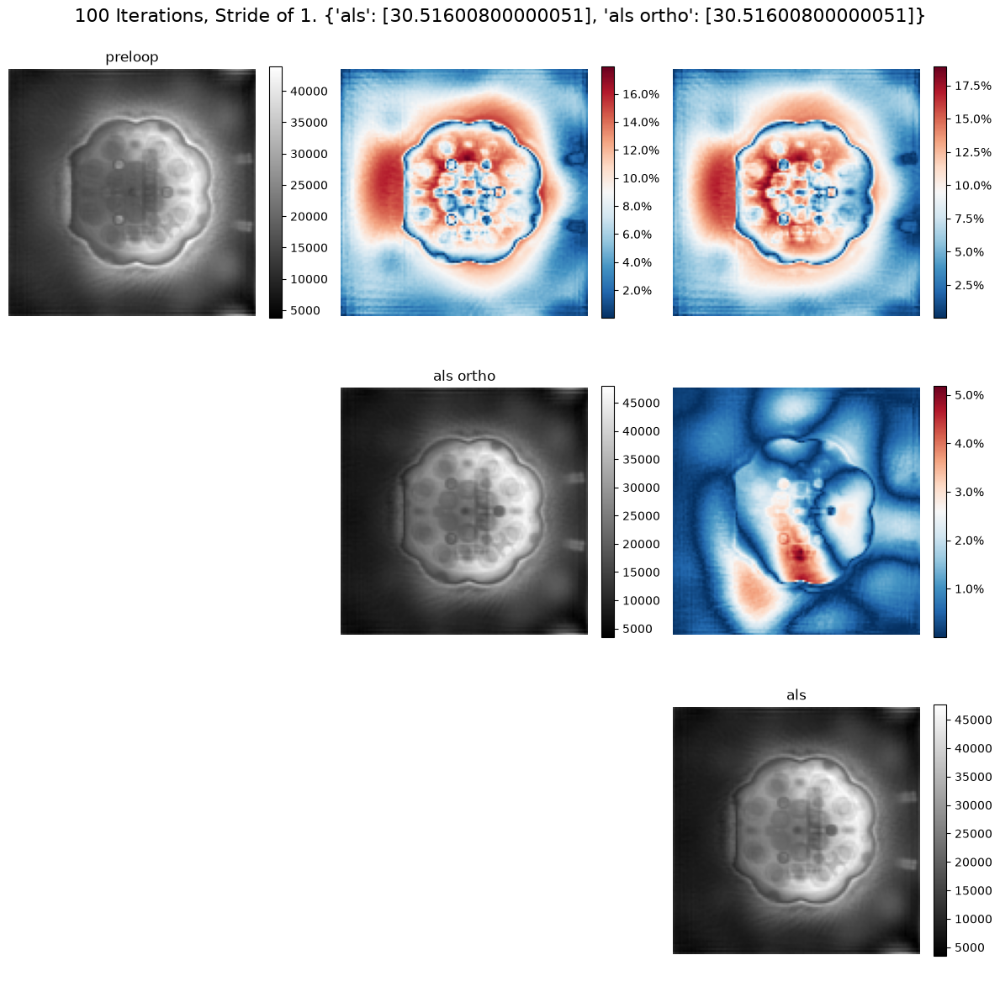

In [ ]:
test_results = {'preloop':preloop, 'als ortho':im_als_ortho}

asm.diff_matrix(test_results, title=f'100 Iterations, Stride of 1. {timings}')

/var/folders/lp/mmccs9596xb7321q5q75xnj00000gn/T/ipykernel_3484/1822038198.py:30: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


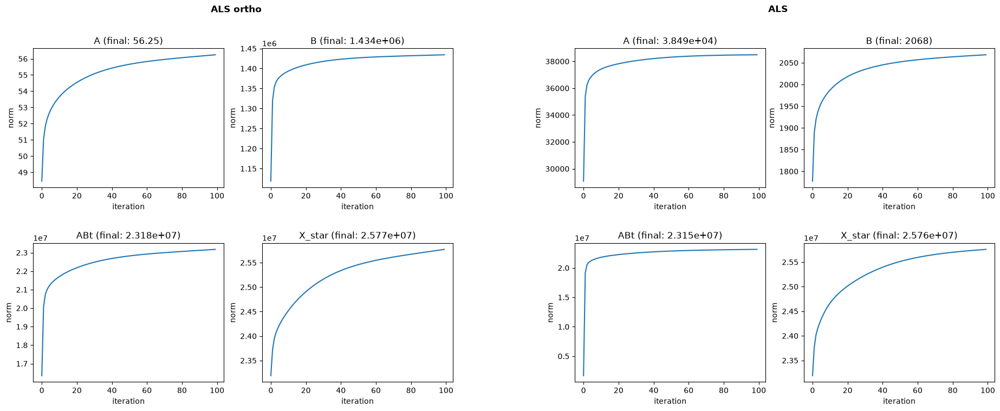

In [48]:
fig = plt.figure(figsize=(20, 8))
subfigs = fig.subfigures(1, 2)

for subfig, (label, nrm) in zip(subfigs, [('ALS ortho', norms_ortho), ('ALS', norms)]):
    subfig.suptitle(label, fontweight='bold')
    axs = subfig.subplots(2, 2)

    axs[0, 0].plot(nrm['A'])
    axs[0, 0].set_title(f'A (final: {nrm["A"][-1]:.4g})')
    axs[0, 0].set_xlabel('iteration')
    axs[0, 0].set_ylabel('norm')

    axs[0, 1].plot(nrm['B'])
    axs[0, 1].set_title(f'B (final: {nrm["B"][-1]:.4g})')
    axs[0, 1].set_xlabel('iteration')
    axs[0, 1].set_ylabel('norm')

    axs[1, 0].plot(nrm['ABt'])
    axs[1, 0].set_title(f'ABt (final: {nrm["ABt"][-1]:.4g})')
    axs[1, 0].set_xlabel('iteration')
    axs[1, 0].set_ylabel('norm')

    axs[1, 1].plot(nrm['X_star'])
    axs[1, 1].set_title(f'X_star (final: {nrm["X_star"][-1]:.4g})')
    axs[1, 1].set_xlabel('iteration')
    axs[1, 1].set_ylabel('norm')

    subfig.subplots_adjust(hspace=0.4)

fig.show()

/var/folders/lp/mmccs9596xb7321q5q75xnj00000gn/T/ipykernel_3484/1741322605.py:18: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


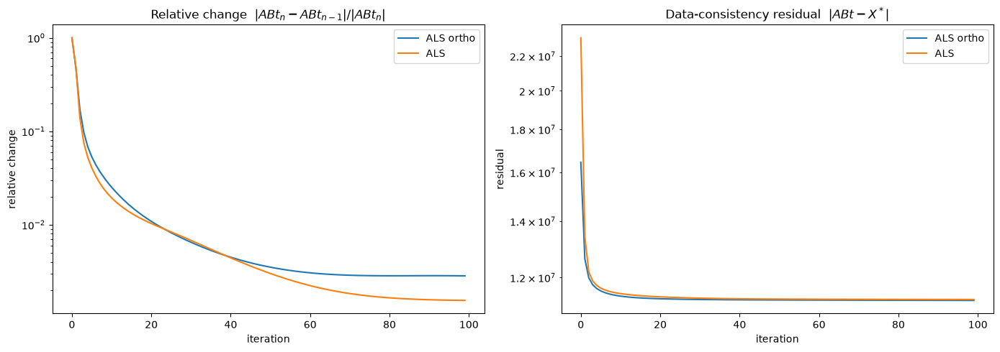

In [49]:
fig, axs = plt.subplots(1, 2, figsize=(14, 5))

for label, nrm in [('ALS ortho', norms_ortho), ('ALS', norms)]:
    axs[0].semilogy(nrm['rel_change'], label=label)
    axs[1].semilogy(nrm['residual'], label=label)

axs[0].set_title(r'Relative change  $|ABt_n - ABt_{n-1}| / |ABt_n|$')
axs[0].set_xlabel('iteration')
axs[0].set_ylabel('relative change')
axs[0].legend()

axs[1].set_title(r'Data-consistency residual  $|ABt - X^*|$')
axs[1].set_xlabel('iteration')
axs[1].set_ylabel('residual')
axs[1].legend()

fig.tight_layout()
fig.show()

done
done
done
done
done
done


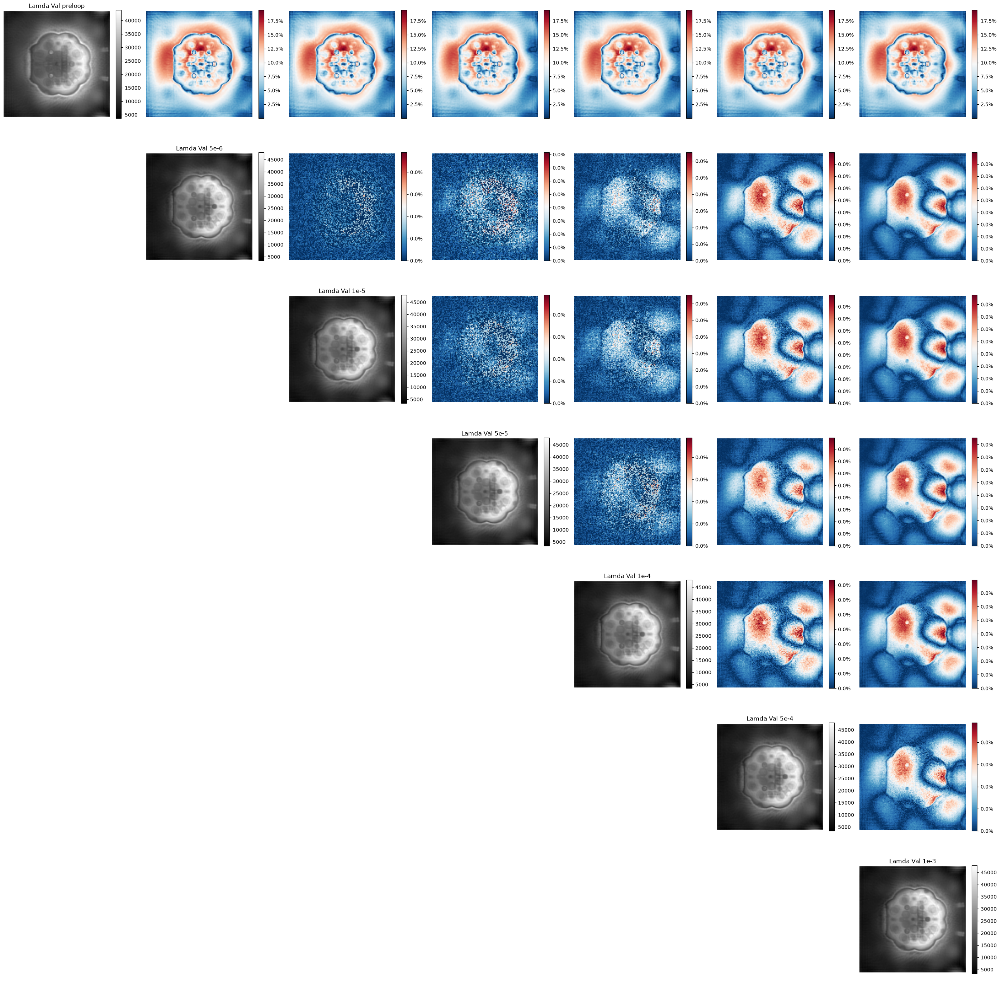

In [62]:
lamda_vals = {'5e-6': 5e-6, '1e-5': 1e-5, '5e-5': 5e-5, '1e-4': 1e-4, '5e-4': 5e-4, '1e-3': 1e-3}
win = 10
stride_len = 2
num_iters = 50
cartesian_input = inner_region.copy()

results = {}
results['preloop'] = {'im': preloop} 
for name, lam in lamda_vals.items():
    output_kspaceals_ortho, im_als_ortho, norms_ortho = LORAKS_imputeals_ortho(n_iters=num_iters, window_size=10, cartesian_inputkspace=inner_region, dtg_mask=maskb, rank= 10, lamda = lam, stride=1, im_dim=126, enlarged_kspace=cartesian_kspace_enl,seed=42, inner_mask = inner_mask, inner_start = start, inner_end = end)
    results[name] = {'im': im_als_ortho}
    print('done')


imsals = {f'Lamda Val {r}': results[r]['im'] for r in results}
asm.diff_matrix(imsals)

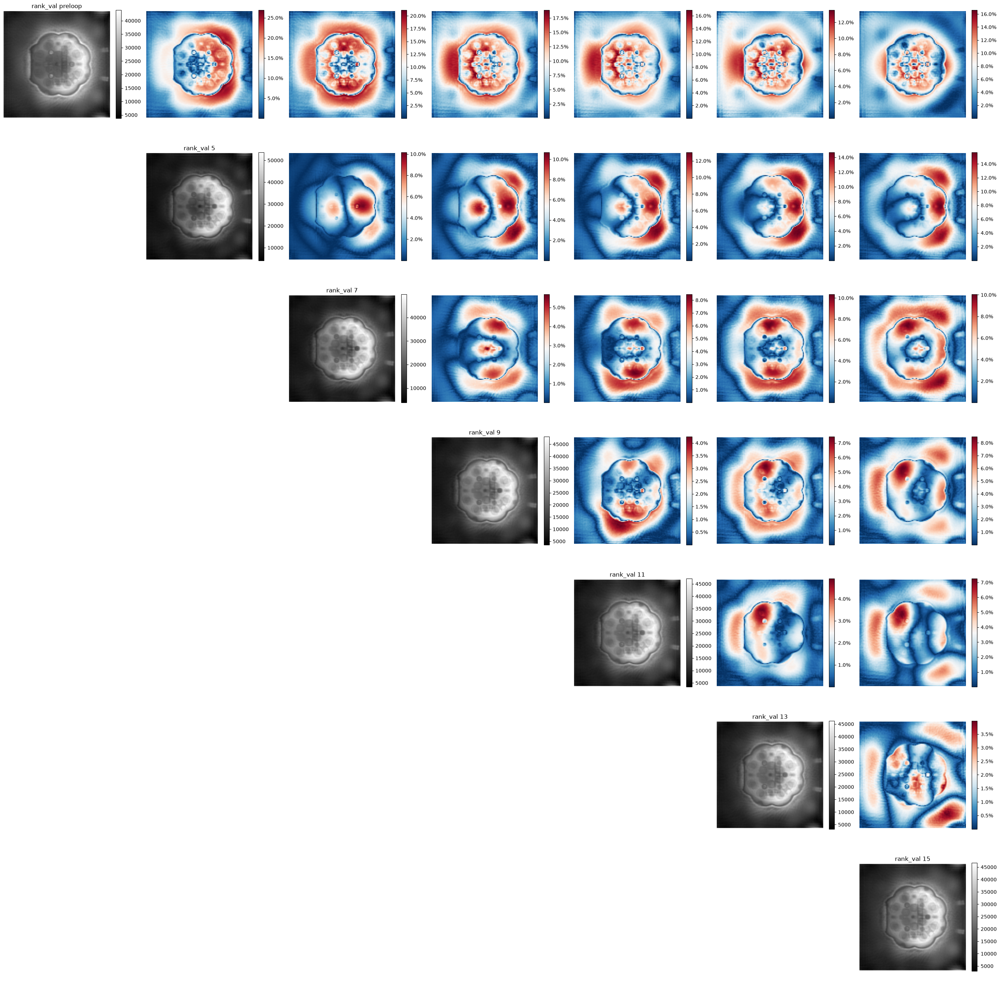

In [10]:
rank_vals = {'5': 5, '7': 7, '9': 9, '11': 11, '13': 13, '15': 15}
win = 10
stride_len = 4
num_iters = 50
cartesian_input = inner_region.copy()

results = {}
results['preloop'] = {'im': preloop} 
for name, rank in rank_vals.items():
    output_kspaceals_ortho, im_als_ortho, norms_ortho = LORAKS_imputeals_ortho(n_iters=num_iters, window_size=10, cartesian_inputkspace=inner_region, dtg_mask=maskb, rank= rank, lamda = 5*10**-5, stride=1, im_dim=126, enlarged_kspace=cartesian_kspace_enl,seed=42, inner_mask = inner_mask, inner_start = start, inner_end = end)
    results[name] = {'im': im_als_ortho}


imsals = {f'rank_val {r}': results[r]['im'] for r in results}
asm.diff_matrix(imsals)